# Analytical model for preventing telecomunications provider customer churn

   
**Prepared by:** 
- Marcos De Andrade Rozic


#### Libraries

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

import matplotlib.pyplot as plt
import matplotlib.colors
import seaborn as sns

import folium
from folium import plugins
from folium.plugins import MarkerCluster
from IPython.display import display

import h3
import branca.colormap as cm

#### Color Palette

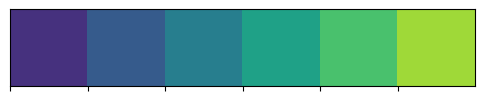

RGB: (0.275191, 0.194905, 0.496005)
HEX: #46327e
RGB: (0.212395, 0.359683, 0.55171)
HEX: #365c8d
RGB: (0.153364, 0.497, 0.557724)
HEX: #277f8e
RGB: (0.122312, 0.633153, 0.530398)
HEX: #1fa187
RGB: (0.288921, 0.758394, 0.428426)
HEX: #4ac16d
RGB: (0.626579, 0.854645, 0.223353)
HEX: #a0da39


In [2]:
viridis = sns.color_palette("viridis", as_cmap=False)

# Visualizar la paleta de colores 'viridis'
sns.palplot(viridis)
plt.show()

# Imprimir los códigos de color RGB y HEX de la paleta 'viridis'
for color in viridis:
    print("RGB:", color)
    print("HEX:", matplotlib.colors.to_hex(color))

### 2. Global Understanding of the Dataset and Variables that Form It

In [3]:
df = pd.read_excel('../data/'+'Telco_customer_churn'+'.xlsx')

In [4]:
df.shape

(7043, 33)

<b> Analysis:</b> Given the size of the dataset, we can see that there are 7043 customers, each with 32 characteristics that describe each case, since one of them is the ID column, which is not relevant.

In [14]:
df.head(5)

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,...,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,...,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,...,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,...,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,...,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,...,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

<b> Analysis:</b> It is observed that all variables, except for Churn Reason, are complete, meaning there are no missing values. Regarding the data types of the variables, most are of object type, indicating that most of the variables do not contain text or non-numeric values, suggesting they are likely mostly categorical. It is also noted that there are numeric variables of both integer and floating-point types.

>- <b>CustomerID:</b> Customer identifier
>- <b>Count:</b>
>- <b>Country:</b> Customer's country
>- <b>State:</b> Customer's state
>- <b>City:</b> Customer's city
>- <b>Zip Code:</b> Customer's city zip code
>- <b>Lat Long:</b> Customer's latitude and longitude
>- <b>Latitude:</b> Latitude of the customer's location
>- <b>Longitude:</b> Longitude of the customer's location
>- <b>Gender:</b> Customer's gender
>- <b>Senior Citizen:</b> Indicator of whether the customer is a senior citizen (1) or not (0)
>- <b>Partner:</b> Indicator of whether the customer has a partner (Yes) or not (No)
>- <b>Dependents:</b> Indicator of whether the customer has dependents (Yes) or not (No)
>- <b>Tenure Months:</b> Number of months the customer has been with the company
>- <b>Phone Service:</b> Indicator of whether the customer has phone service (Yes) or not (No)
>- <b>Multiple Lines:</b> Indicator of whether the customer has multiple phone lines (Yes) or not (No)
>- <b>Internet Service:</b> Indicator of whether the customer has internet service (Yes) or not (No)
>- <b>Online Security:</b> Indicator of whether the customer has online security (Yes) or not (No)
>- <b>Online Backup:</b> Indicator of whether the customer has online backup (Yes) or not (No)
>- <b>Device Protection:</b> Indicator of whether the customer has device protection (Yes) or not (No)
>- <b>Tech Support:</b> Indicator of whether the customer has tech support (Yes) or not (No)
>- <b>Streaming TV:</b> Indicator of whether the customer has streaming TV service (Yes) or not (No)
>- <b>Streaming Movies:</b> Indicator of whether the customer has streaming movies service (Yes) or not (No)
>- <b>Contract:</b> Type of contract the customer has: month-to-month, one year, or two years
>- <b>Paperless Billing:</b> Indicator of whether the customer opted for paperless billing (Yes) or not (No)
>- <b>Payment Method:</b> Type of payment method used by the customer: electronic check, mailed check, bank transfer, or credit card
>- <b>Monthly Charges:</b> Amount of the customer's monthly charges
>- <b>Total Charges:</b> Total amount of the customer's charges

In [16]:
df.isnull().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64

In [17]:
df.isna().sum()

CustomerID              0
Count                   0
Country                 0
State                   0
City                    0
Zip Code                0
Lat Long                0
Latitude                0
Longitude               0
Gender                  0
Senior Citizen          0
Partner                 0
Dependents              0
Tenure Months           0
Phone Service           0
Multiple Lines          0
Internet Service        0
Online Security         0
Online Backup           0
Device Protection       0
Tech Support            0
Streaming TV            0
Streaming Movies        0
Contract                0
Paperless Billing       0
Payment Method          0
Monthly Charges         0
Total Charges           0
Churn Label             0
Churn Value             0
Churn Score             0
CLTV                    0
Churn Reason         5174
dtype: int64

<b> Analysis:</b> None of the variables present null or NaN values, except for Churn Reason.

In [18]:
df.nunique()

CustomerID           7043
Count                   1
Country                 1
State                   1
City                 1129
Zip Code             1652
Lat Long             1652
Latitude             1652
Longitude            1651
Gender                  2
Senior Citizen          2
Partner                 2
Dependents              2
Tenure Months          73
Phone Service           2
Multiple Lines          3
Internet Service        3
Online Security         3
Online Backup           3
Device Protection       3
Tech Support            3
Streaming TV            3
Streaming Movies        3
Contract                3
Paperless Billing       2
Payment Method          4
Monthly Charges      1585
Total Charges        6531
Churn Label             2
Churn Value             2
Churn Score            85
CLTV                 3438
Churn Reason           20
dtype: int64

<b>Analysis:</b> To understand the nature of the data, we attempt to see the number of unique values for each variable.

> <b>Variables with a single value:</b>
> - <b>Count, Country, City.</b> These variables have only one value for each of the records.

> <b>Identifier variable:</b>
> - <b>CustomerID.</b> This variable identifies each data record as unique, so all records have a different value.

> <b>Geographic variables:</b>
> - <b>City:</b> With 1,129 unique values.
> - <b>Zip Code, Lat Long, Latitude, Longitude:</b> These geographic variables have many unique values.

> <b>Binary variables:</b>
> - <b>Gender, Senior Citizen, Partner, Dependents, Phone Service, Paperless Billing, Churn Label, Churn Value.</b> These variables have two unique values and are therefore considered categorical. They take values of (Yes/No) or (0/1).

> <b>Variables with multiple categories:</b>
> - <b>Multiple Lines, Internet Service, Online Security, Online Backup, Device Protection, Tech Support, Streaming TV, Streaming Movies, Contract, Payment Method:</b> All these variables have 3 or 4 unique values, indicating that they are categorical with several possible options.
> - <b>Churn Reason:</b> With 20 unique values, this variable provides specific information about churn reasons, useful for qualitative analysis or for grouping according to similar reasons.

In [19]:
df.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


The table shows that the dataset contains 7,043 complete records, with no missing values, covering both geographic and financial characteristics of the customers. The geographic variables, such as zip code and latitude/longitude, exhibit wide dispersion, reflecting a diverse customer base in terms of location. The average tenure is 32 months, with 50% of customers staying a maximum of 29 months, indicating a significant level of turnover. The average monthly charge is 64 , with a maximum of 118, suggesting different levels of services or packages subscribed to. The average total charges amount to 2,290. Addicionally, the churn rate is 26, meaning that around a quarter of the customers have left the service. The Churn Score ranges from 5 to 100, with an average of 58.7, indicating a moderate overall risk of churn. Lastly, there are no signs of extreme outliers in the "Tenure" and "Monthly Charges" variables, suggesting that the data is fairly consistent and suitable for further analysis. The customer lifetime value (CLTV) ranges from 2,003 to 6,500, which could be useful for identifying strategically valuable customers.

### 3. Univariate Analysis

###### Chart Functions

In [20]:
def subplot_2(suptitle, hist_title, hist_data, hist_xlabel, hist_ylabel, boxplot_title, boxplot_data):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,5))
    fig.suptitle(suptitle)

    #histograma
    ax1.set_title(hist_title)
    sns.histplot(data=hist_data, bins=15, ax=ax1, color='#365c8d')
    ax1.set_xlabel(hist_xlabel)
    ax1.set_ylabel(hist_ylabel)
    plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula

    #boxplot
    ax2.set_title(boxplot_title)
    sns.boxplot(x=boxplot_data, ax=ax2, palette='viridis', orient='h', width=0.25)  # `palette` y `orient` para estilización
    ax2.set_xlabel(hist_xlabel)
    ax2.set_ylabel(hist_ylabel)
    plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula
    
    plt.show()

In [21]:
def subplot_3(x, y, violin_title, violin_xlabel, violin_ylabel, boxplot_title, boxplot_xlabel, boxplot_ylabel):
    plt.figure(figsize=(18, 8))  # Adjust the size of the global figure
    
    #Violin
    plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, posición 1
    sns.violinplot(x=x, y=y, palette="viridis", width=0.8)
    plt.title(violin_title, fontsize=12)
    plt.xlabel(violin_xlabel, fontsize=12)
    plt.ylabel(violin_ylabel, fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula

    #Boxplot
    plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, posición 2
    sns.boxplot(x=x, y=y, linewidth=1, palette='viridis', width=0.25)
    plt.title(boxplot_title, fontsize=12)
    plt.xlabel(boxplot_xlabel, fontsize=12)
    plt.ylabel(boxplot_ylabel, fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula

    plt.tight_layout()
    plt.show()

In [22]:
def subplot_4(df, column_name, bins_count=11):
    churned = df[df['Churn Value'] == 1][column_name]
    not_churned = df[df['Churn Value'] == 0][column_name]

    plt.figure(figsize=(18, 6))

    # Determine the common bin range for both data sets
    bins = np.linspace(min(df[column_name]), max(df[column_name]), bins_count)

    # Create histograms for both distributions
    n, bins, patches = plt.hist([churned, not_churned], bins=bins, color=['#1fa187', '#365c8d'], label=['Churn: Yes', 'Churn: No'], edgecolor='black', rwidth=0.9)

    # Title and tags
    plt.title(f'Distribución de {column_name} por abandono de clientes')
    plt.xlabel(column_name)
    plt.ylabel('Count')
    plt.legend(title='Churn', loc='upper right') #Leyenda
    plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula
    
    # Text on the bars
    for bar in patches[0] + patches[1]:
        height = bar.get_height()
        if height > 0:  # Text over the bar - Make sure the bar exists
            text_y_position = height + np.max(n) * 0.01
            plt.text(bar.get_x() + bar.get_width() / 2, text_y_position,
                     f'{int(height)}', ha='center', va='bottom', color='black', fontsize=9)

    plt.show()

#### 3.1. Categorical Variables

In [23]:
categorical_variables = ['Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method']

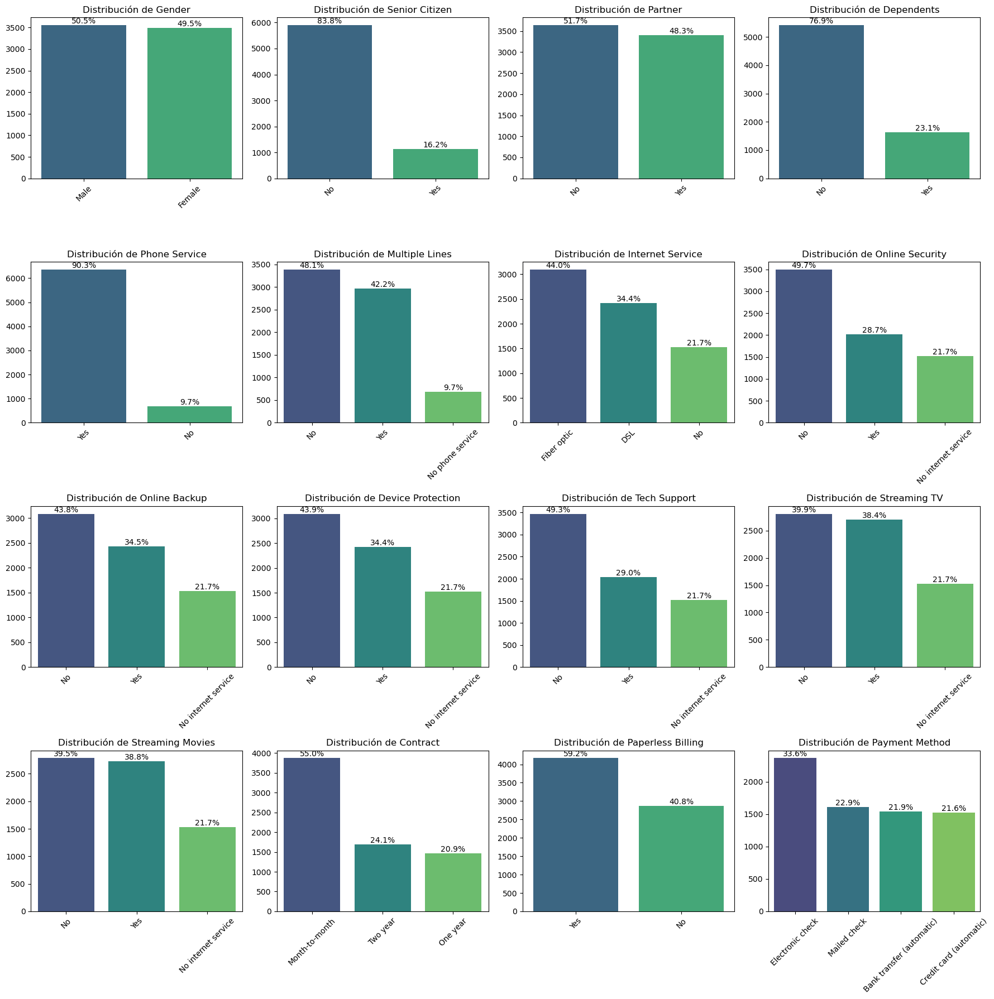

In [24]:
fig, axes = plt.subplots(4, 4, figsize=(18, 18))
axes = axes.flatten()  # Flattens shaft array for easy access

for i, var in enumerate(categorical_variables):
    total = df[var].value_counts().sum()
    sns.countplot(x=var, data=df, ax=axes[i], order=df[var].value_counts().index, palette='viridis')
    axes[i].set_title(f'Distribución de {var}')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

    # Percentage labels on each bar
    for p in axes[i].patches:
        height = p.get_height()  # bar height
        percentage = 100 * height / total
        axes[i].text(p.get_x() + p.get_width() / 2., height, f'{percentage:.1f}%', ha="center", va='bottom')

plt.tight_layout()
plt.show()

<b>Anlysis: </b>

- The gender distribution is almost equal, indicating no gender bias in the data.
- A large majority of customers are not senior citizens, which could influence the adoption of certain services.
- The presence of partners and dependents is quite balanced, which could have implications for income stability and service loyalty.
- Most customers have phone service, but there is a more even split in multiple line subscriptions.
- For internet service, there is a notable adoption of fiber optic, though DSL remains significant.
- Additional services like online security, online backup, device protection, and tech support show that less than half of customers opt for them.
- Streaming services are moderately popular, but not universally adopted, which could indicate a potential area for growth or churn based on service offerings.
- Paperless billing is preferred by a majority, indicating a predisposition towards digital convenience.
- The distribution of payment methods shows variety, with a preference for electronic checks, followed by bank transfers and credit cards.

#### 3.2. Numerical Variables

#### 3.2.1. Tenuere

In [25]:
df['Tenure Months'].describe()

count    7043.000000
mean       32.371149
std        24.559481
min         0.000000
25%         9.000000
50%        29.000000
75%        55.000000
max        72.000000
Name: Tenure Months, dtype: float64

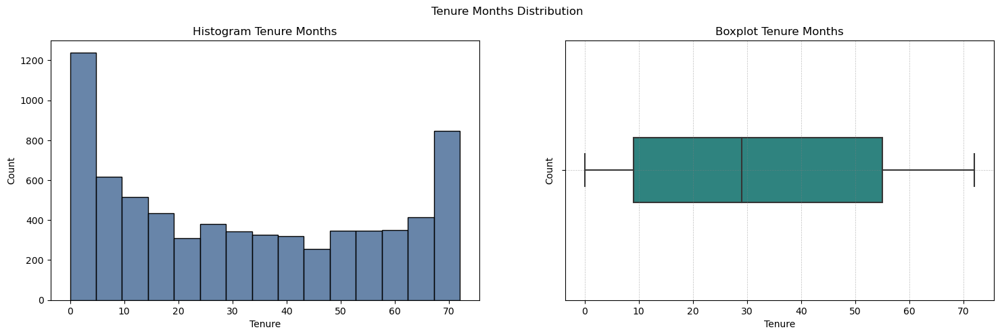

In [26]:
subplot_2(suptitle = 'Tenure Months Distribution',
        hist_title = 'Histogram Tenure Months', 
        hist_data = df['Tenure Months'], 
        hist_xlabel = 'Tenure', 
        hist_ylabel = 'Count', 
        boxplot_title = 'Boxplot Tenure Months', 
        boxplot_data = df['Tenure Months'])

<b>Analysis: </b>

<b>Histogram</b>
- <b>Data Distribution:</b> The histogram reveals an interesting pattern with a significant peak on the far left, indicating that a large number of customers have a very short service duration (close to 0 months). Additionally, there are notable increases in the longer duration intervals (close to 70 months), which could suggest that many customers are either quite new or have been with the service for a long time.
- <b>Client Behavior:</b> The concentration of customers at the extremes of the distribution suggests two things: a group of potentially dissatisfied or trial-period customers who leave the service quickly, and a loyal group of long-term customers. This feature is crucial for strategies focused on improving initial retention and maximizing the value of loyal customers.

<b>Boxplot</b>
- <b>Distribution and Outliers:</b> The boxplot shows that the median is around 30 months, with most customers clustered between approximately 10 and 60 months. There is no significant presence of outliers, indicating a relatively uniform distribution within these ranges.
- <b>Potential Insights:</b> The interquartile range suggests that half of the customers have a duration between one and five years. The lack of outliers implies that retention policies and customer satisfaction may be consistent or effectively managed up to a certain point in the customer lifecycle.

#### 3.2.2. Monthly Charges

In [27]:
df['Monthly Charges'].describe()

count    7043.000000
mean       64.761692
std        30.090047
min        18.250000
25%        35.500000
50%        70.350000
75%        89.850000
max       118.750000
Name: Monthly Charges, dtype: float64

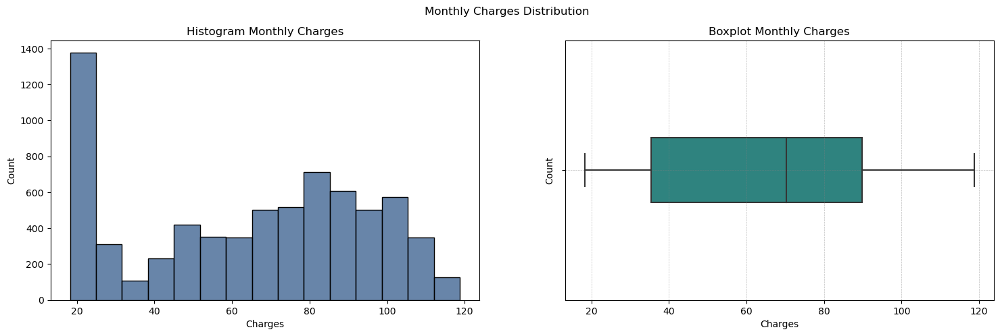

In [28]:
subplot_2(suptitle = 'Monthly Charges Distribution',
        hist_title = 'Histogram Monthly Charges', 
        hist_data = df['Monthly Charges'], 
        hist_xlabel = 'Charges', 
        hist_ylabel = 'Count', 
        boxplot_title = 'Boxplot Monthly Charges', 
        boxplot_data = df['Monthly Charges'])

<b>Analysis: </b>

<b>Histogram:</b>

- <b>Data Distribution:</b> The histogram of "Monthly Charges" shows a bimodal distribution, with a prominent peak for lower charges and another peak in the mid-to-high price range. This suggests that there is a significant group of customers paying both low and relatively high monthly fees.
- <b>Customer Behavior:</b> The presence of two modes may indicate different customer segments within the market, likely divided by the type of packages or services they subscribe to. Customers with low charges may be using basic services, while higher charges could be associated with premium packages or multiple additional services.

<b>Boxplot:</b>

- <b>Distribution and Outliers:</b> The boxplot reveals that the median of monthly charges is near the mid-range, with a balanced distribution on both sides. There don’t appear to be significant outliers, indicating that most charges fall within an expected range without unusual extremes.
- <b>Potential Insights:</b> The balanced distribution and lack of extreme outliers suggest that most customers choose price packages within a standard range offered by the company. This may be useful for assessing the effectiveness of the current pricing structure.

#### 3.2.3 Total Charges

In [29]:
# Print all no numeric values found
for x, value in enumerate(df['Total Charges']):
    if type(value) == str:
        print("{}. {}".format(x, value))

2234.  
2438.  
2568.  
2667.  
2856.  
4331.  
4687.  
5104.  
5719.  
6772.  
6840.  


In [30]:
# Convert Total Charges to numeric values and delete no numeric logs
df['Total Charges'] = pd.to_numeric(df['Total Charges'], errors='coerce')
df.dropna(subset=['Total Charges'], inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7032 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7032 non-null   object 
 1   Count              7032 non-null   int64  
 2   Country            7032 non-null   object 
 3   State              7032 non-null   object 
 4   City               7032 non-null   object 
 5   Zip Code           7032 non-null   int64  
 6   Lat Long           7032 non-null   object 
 7   Latitude           7032 non-null   float64
 8   Longitude          7032 non-null   float64
 9   Gender             7032 non-null   object 
 10  Senior Citizen     7032 non-null   object 
 11  Partner            7032 non-null   object 
 12  Dependents         7032 non-null   object 
 13  Tenure Months      7032 non-null   int64  
 14  Phone Service      7032 non-null   object 
 15  Multiple Lines     7032 non-null   object 
 16  Internet Service   7032 

In [31]:
df['Total Charges'].describe()

count    7032.000000
mean     2283.300441
std      2266.771362
min        18.800000
25%       401.450000
50%      1397.475000
75%      3794.737500
max      8684.800000
Name: Total Charges, dtype: float64

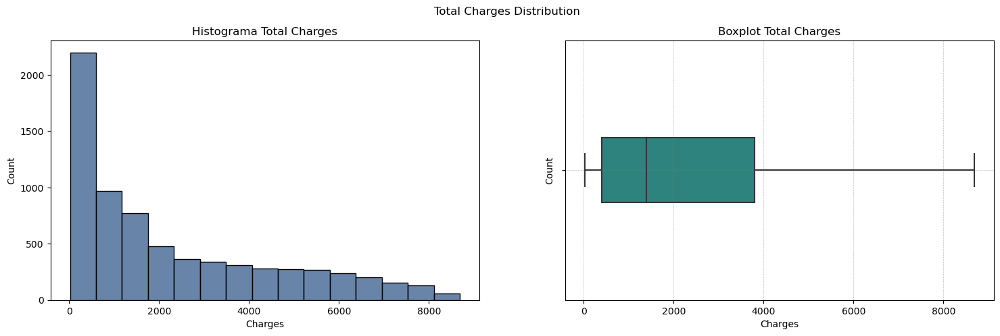

In [32]:
subplot_2(suptitle = 'Total Charges Distribution',
        hist_title = 'Histograma Total Charges', 
        hist_data = df['Total Charges'], 
        hist_xlabel = 'Charges', 
        hist_ylabel = 'Count', 
        boxplot_title = 'Boxplot Total Charges', 
        boxplot_data = df['Total Charges'])

<b>Analysis: </b>

<b>Histogram<b>
- <b>Data Distribution:</b> The histogram shows that a large number of customers have relatively low total charges, with a clear decreasing trend as charges increase. This could indicate that many customers are either new or have not accumulated high total charges, possibly due to a short tenure or less expensive service packages.
- <b>Customer Behavior:</b> The concentration of customers with low charges could be indicative of high churn rates among recent customers or those with fewer services, which could be an area of focus for retention strategies.
    
<b>Boxplot</b>
    
- <b>Dstribution and Outliers:</b> The boxplot reveals that the median of total charges is around 2000, with a relatively symmetric distribution between the first and third quartiles. Outliers are visible beyond the upper limit of the boxplot, suggesting that some customers have significantly higher charges than the majority.
- <b>Potential Insights:</b> The outliers may represent long-term customers with multiple services or premium packages. This customer segment could be crucial for churn analysis, as their retention may have a significant impact on revenue.
Avísame si necesitas ayuda con algo más.

#### 3.3 Geographic Variables

> <b>Variables:</b> Country, State, CIty, Zip Code, Latitude, Longitude<br><br>
> <b>Target Variable:</b> Churn Value

In [33]:
df.columns

Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

In [34]:
df.groupby(['Country', 'State'])['CustomerID'].count()

Country        State     
United States  California    7032
Name: CustomerID, dtype: int64

In [35]:
df['City'].nunique()

1129

#### 3.3.1 Distribution of Clients by City

#### Population map by city

In [36]:
# Group Latitude and Longitude, count customers by location
data_grouped = df.groupby(['Latitude', 'Longitude']).agg({'CustomerID': 'count'}).reset_index()

# Create a map with approximate latitude and longitude
mapa = folium.Map(location=[data_grouped['Latitude'].mean(), data_grouped['Longitude'].mean()], zoom_start=6)

# Add groupings
marker_cluster = MarkerCluster().add_to(mapa)

# Iterate over the grouped data and add a marker for each location
for idx, row in data_grouped.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Clientes: {row['CustomerID']}",
    ).add_to(marker_cluster)

display(mapa)

####  Population scatter map

In [37]:
# Agrupar Latitud y Longuitud, contar clientes por localización
data_grouped = df.groupby(['Latitude', 'Longitude']).agg({'CustomerID': 'count'}).reset_index()

# Create a map with approximate latitude and longitude
mapa = folium.Map(location=[data_grouped['Latitude'].mean(), data_grouped['Longitude'].mean()], zoom_start=6)

# Add groupings
marker_cluster = MarkerCluster().add_to(mapa)

# Iterate over the grouped data and add a circular marker
for idx, row in data_grouped.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=2,         # Radius of points
        color='#277f8e',  # Dot border color
        fill=True,
        fill_color='#277f8e',  # Point fill color
        fill_opacity=0.8,      # Dot fill opacity
        popup=f"Clientes: {row['CustomerID']}"
    ).add_to(mapa)

# Show the map directly in Jupyter Notebook
display(mapa)

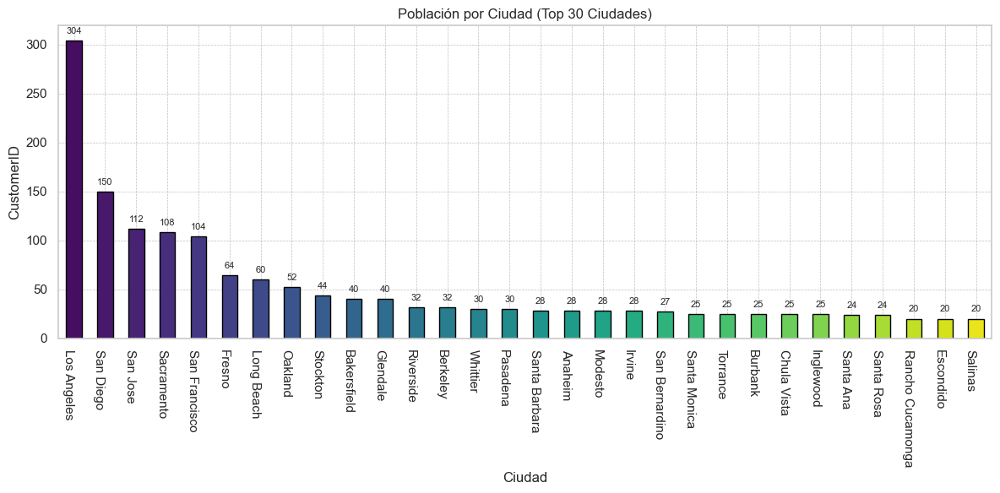

In [38]:
# Count cities in the data set
city_counts = df['City'].value_counts()

# Show top 30 cities
city_counts_top = city_counts.head(30)  

sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
bars = city_counts_top.plot(kind='bar', color=sns.color_palette("viridis", len(city_counts_top)), edgecolor='black')

# Notes on bars
for bar in bars.patches:
    bars.annotate(format(bar.get_height(), '.0f'), 
                  (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                  ha='center', va='center', size=8, xytext=(0, 8), 
                  textcoords='offset points')

plt.title('Población por Ciudad (Top 30 Ciudades)')
plt.xlabel('Ciudad')
plt.ylabel('CustomerID')
plt.xticks(rotation=270, ha='right')
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula
plt.tight_layout()

plt.show()

The map shows that there is a higher concentration of customers in the main cities of the state, such as Los Angeles, San Diego, San Jose, Sacramento, and San Francisco, with Los Angeles having the highest concentration of customers. In addition to being distributed across the main cities, there are also smaller clusters of customers in the outskirts of these cities and along the state borders. These visualizations are useful for gaining an overall perspective of the data and how it is distributed; however, to gain a more detailed understanding of the distribution of customers who churn and those who don’t, it is necessary to apply other types of visualizations.

#### Hexagon Map according to the number customer churn

When working with customer data that includes geospatial variables such as latitude and longitude, it is useful to assess how these variables vary according to location on the map. One of the most recommended ways to obtain measurements when dealing with large cities or countries is to divide the area into geometric shapes, particularly hexagons. Delivery service and taxi applications use hexagons to calculate demand in specific areas. To conduct large-scale analysis of geospatial datasets, Uber has developed a library called "h3" (https://www.uber.com/en-IN/blog/h3/), which divides the Earth's map into a hexagon-based grid system, providing a more spatially uniform and efficient coverage compared to other geometric shapes. The hexagon size varies depending on the scale of the country or city being analyzed; however, since we are working within a single U.S. state, a standard hexagon size will be used for mapping. This size has been determined based on the following documentation: https://h3geo.org/docs/core-library/restable/.

In [39]:
# Define the level of precision for the hexagons to be formed
resolution_level = 5

# Assign hexagonal identifiers to each customer based on their coordinates
df['geo_hex'] = df.apply(lambda rec: h3.geo_to_h3(rec['Latitude'], rec['Longitude'], resolution_level), axis=1)

# Group the data by hexagons and calculate the number of customers in each
hex_summary = df.groupby('geo_hex').agg(client_count=('CustomerID', 'size')).reset_index()

# Extract the central coordinates of each hexagon
hex_summary['hex_center'] = hex_summary['geo_hex'].apply(lambda h: h3.h3_to_geo(h))

# Set the range of values for the color scale according to the number of customers
min_clients, max_clients = hex_summary['client_count'].min(), hex_summary['client_count'].max()

color_scale = cm.LinearColormap(colors=["#46327e", "#365c8d", "#277f8e", "#1fa187", "#4ac16d", "#a0da39"], vmin=min_clients, vmax=max_clients)

# Obtain the average coordinates to center the map
avg_latitude  = hex_summary['hex_center'].apply(lambda loc: loc[0]).mean()
avg_longitude = hex_summary['hex_center'].apply(lambda loc: loc[1]).mean()

# Create the map with the calculated average center
map_view = folium.Map(location=[avg_latitude, avg_longitude], zoom_start=6, tiles='cartodb positron')

# Iterate over each row of hex_summary to add the polygons to the map
for _, hex_data in hex_summary.iterrows():
    polygon = folium.Polygon(
        locations=h3.h3_to_geo_boundary(hex_data['geo_hex']),
        fill=True,
        fill_color=color_scale(hex_data['client_count']),
        fill_opacity=0.9,
        line_opacity=0,
        stroke=False,
        tooltip=f"Clients: {hex_data['client_count']}"
    )
    polygon.add_to(map_view)

# Map Legend
color_scale.caption = 'Client Concentration'
map_view.add_child(color_scale)

map_view

In [40]:
# Group the data by hexagons and calculate the number of customers in each one.
hex_summary = df.groupby('geo_hex').agg(
    client_count = ('CustomerID', 'size'),
    churn_count  = ('Churn Value', 'sum')
).reset_index()


hex_summary['churn_rate'] = hex_summary['churn_count'] / hex_summary['client_count']

# Extract the central coordinates of each hexagon.
hex_summary['hex_center'] = hex_summary['geo_hex'].apply(lambda h: h3.h3_to_geo(h))
hex_summary['latitude']   = hex_summary['hex_center'].apply(lambda loc: loc[0])
hex_summary['longitude']  = hex_summary['hex_center'].apply(lambda loc: loc[1])

In [41]:
hex_summary

,geo_hex,client_count,churn_count,churn_rate,hex_center,latitude,longitude
0,85280043fffffff,4,1,0.25,"(40.25901282734662, -124.24903195497484)",40.259013,-124.249032
1,8528004bfffffff,4,1,0.25,"(40.35157994874869, -124.08171877178899)",40.351580,-124.081719
2,8528004ffffffff,4,1,0.25,"(40.41058722171124, -124.26118683642231)",40.410587,-124.261187
3,85280207fffffff,4,1,0.25,"(40.838812426557396, -123.7684958264075)",40.838812,-123.768496
4,8528020bfffffff,4,1,0.25,"(40.871113019081776, -123.41831958470351)",40.871113,-123.418320
...,...,...,...,...,...,...,...
709,85485b03fffffff,5,1,0.20,"(32.85960940929154, -114.8614774058305)",32.859609,-114.861477
710,85485b33fffffff,5,1,0.20,"(33.02187009556133, -115.20055026101645)",33.021870,-115.200550
711,85485b63fffffff,5,0,0.00,"(33.271088874143594, -114.68571131077704)",33.271089,-114.685711
712,85485babfffffff,5,3,0.60,"(32.85756812478553, -115.20195988454765)",32.857568,-115.201960


#### Mapa de hexágonos según el ratio de abandono de clientes

In [42]:
# Set the range of values for the color scale based on the number of customers.
min_churn, max_churn = hex_summary['churn_rate'].min(), hex_summary['churn_rate'].max()

color_scale = cm.LinearColormap(colors=["#46327e", "#365c8d", "#277f8e", "#1fa187", "#4ac16d", "#a0da39"], vmin=min_churn, vmax=max_churn)

# Obtain the average coordinates to center the map.
avg_latitude  = hex_summary['hex_center'].apply(lambda loc: loc[0]).mean()
avg_longitude = hex_summary['hex_center'].apply(lambda loc: loc[1]).mean()

# Create the map with the calculated average center.
map_view = folium.Map(location=[avg_latitude, avg_longitude], zoom_start=6, tiles='cartodb positron')

# Iterate over each row of hex_summary to add the polygons to the map.
for _, hex_data in hex_summary.iterrows():
    polygon = folium.Polygon(
        locations=h3.h3_to_geo_boundary(hex_data['geo_hex']),
        fill=True,
        fill_color=color_scale(hex_data['churn_rate']),
        fill_opacity=0.9,
        line_opacity=0,
        stroke=False,
        tooltip=f"Churn Rate: {hex_data['churn_rate']}<br>Number of Clients: {hex_data['client_count']}"
    )
    polygon.add_to(map_view)

# Map legend.
color_scale.caption = 'Chrun Rate'
map_view.add_child(color_scale)

map_view

It can be observed where the hexagonal regions are located with the highest total number of customers, and it can be noted that there are numerous customers in Los Angeles and its surroundings. In general, it can be seen that in the city of Los Angeles there are fewer hexagons with a customer churn rate of 50%. In a few hexagons, it can be seen that there is more than an 80% customer churn rate, but in these areas, the total number of customers is around 10. In the other two cities with the highest number of customers, such as San Francisco and Sacramento, it can be seen that around 50% of customers churn.

#### Scatter plot of customers by hexagon regarding the churn rate

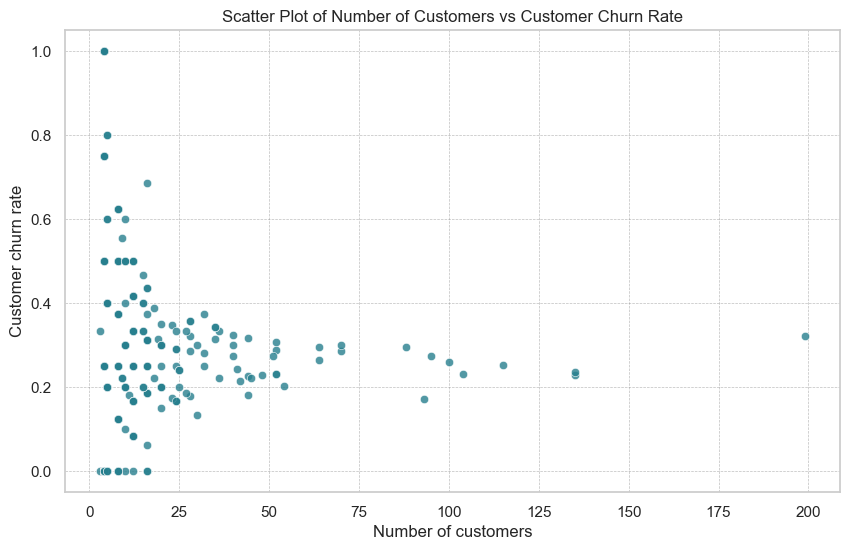

In [43]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='client_count', y='churn_rate', data=hex_summary, color='#277f8e', alpha=0.8)

plt.title('Scatter Plot of Number of Customers vs Customer Churn Rate',fontsize=12)
plt.xlabel('Number of customers', fontsize=12)
plt.ylabel('Customer churn rate', fontsize=12)
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula

plt.show()

It is observed that the customer churn rate above 25% only occurs in hexagons where the number of customers is low. Considering hexagons with a high customer churn rate will not be very relevant due to the low number of customers in these hexagons. Overall, there does not appear to be any geographic area where customers behave significantly differently.

### 4. Multivariable Analysis

#### 4.1. Contract Duration Distribution by Customer Churn

> <b>Variable:</b> Tenure Months<br><br>
> <b>Target variable:</b> Churn Value

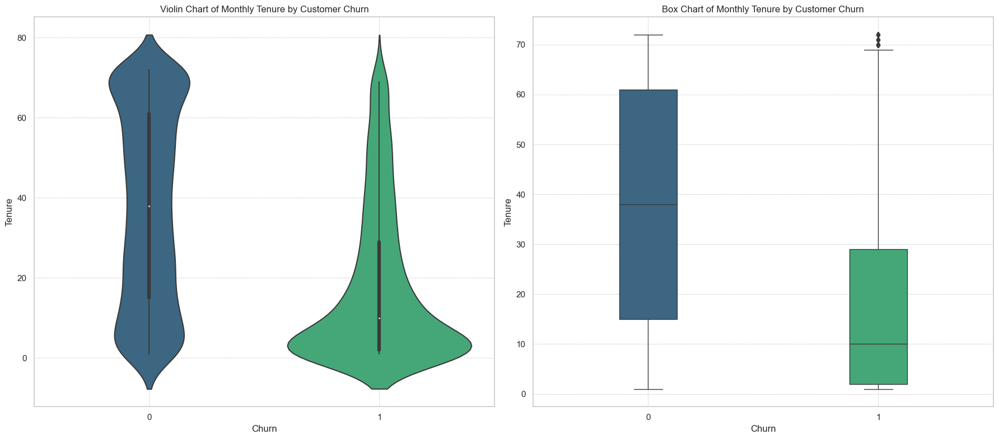

In [44]:
subplot_3(x = df['Churn Value'], 
          y = df['Tenure Months'], 
          violin_title = 'Violin Chart of Monthly Tenure by Customer Churn', 
          violin_xlabel = 'Churn', 
          violin_ylabel = 'Tenure', 
          boxplot_title = 'Box Chart of Monthly Tenure by Customer Churn', 
          boxplot_xlabel = 'Churn', 
          boxplot_ylabel = 'Tenure')

<b>Analysis: </b>

<b>Violin Graph:</b>

- <b>Churn = 0 (No Churn):</b> The graph shows a broad distribution with a median around 40 months. This suggests that customers who do not churn tend to stay for a longer period<br>
- <b>Churn = 1 (Churn):</b> The distribution is noticeably sharper with a much lower median, around 10 months, indicating that many of the customers who churn do so in the early stages of their relationship with the company.<br>

<b>Boxplot:</b>

- <b>No Churn:</b> The box extends from approximately 20 to 60 months, with some outliers who have stayed much longer, indicating strong long-term retention.<br>
- <b>Churn:</b> The interquartile range is much smaller, and the box is positioned lower on the tenure scale. This reaffirms that churners tend to leave early.

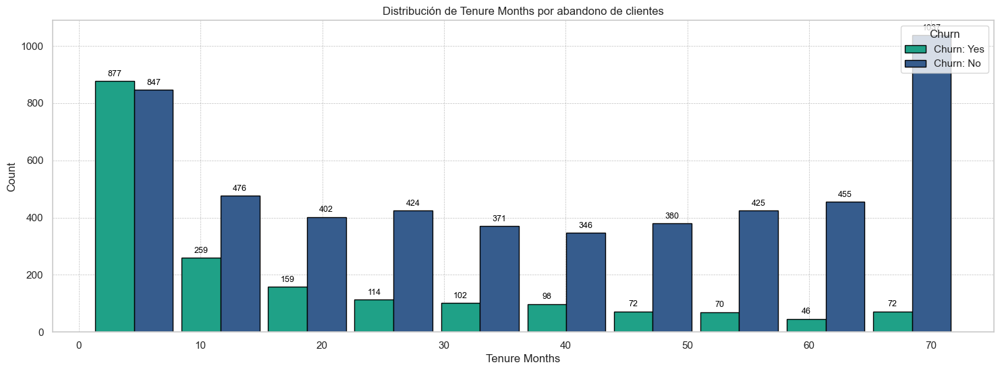

In [45]:
subplot_4(df, 'Tenure Months')

<b>Analysis: </b>

- <b>General Distribution:</b> Most customers with low tenure (0-10 months) tend to churn, as shown in the bars where the green segment (Churn) is prominent.
- <b>Loyal Customers:</b> As tenure increases (especially after 20 months), the proportion of non-churn customers (in blue) becomes dominant, and the proportion of churn decreases sharply.

#### 4.2. Distribution of monthly charges for customer abandonment
> <b>Variables:</b> Monthly Charges<br><br>
> <b>Target Variable:</b> Churn Value

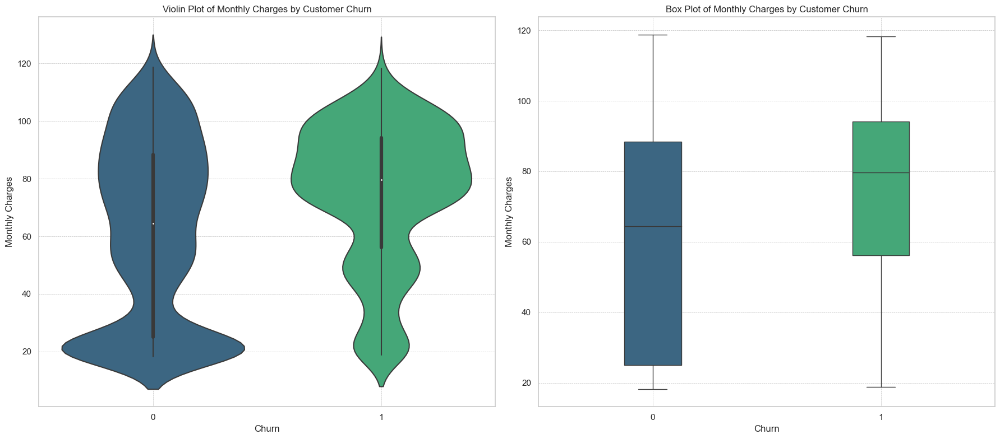

In [46]:
subplot_3(x = df['Churn Value'], 
          y = df['Monthly Charges'], 
          violin_title = 'Violin Plot of Monthly Charges by Customer Churn', 
          violin_xlabel = 'Churn', 
          violin_ylabel = 'Monthly Charges', 
          boxplot_title = 'Box Plot of Monthly Charges by Customer Churn', 
          boxplot_xlabel = 'Churn', 
          boxplot_ylabel = 'Monthly Charges')

<b>Analysis: </b>

<b> Violin Graph:</b> <br>
It shows that customers who churn (Churn 1) tend to have higher distributions of monthly charges compared to those who stay. This may suggest that higher prices contribute to churn, especially if customers do not perceive adequate value for those costs.

<b> Boxplot:</b> <br>
It indicates that the median and interquartile range of monthly charges are higher for customers who churn, supporting the theory of price sensitivity as a factor in churn.

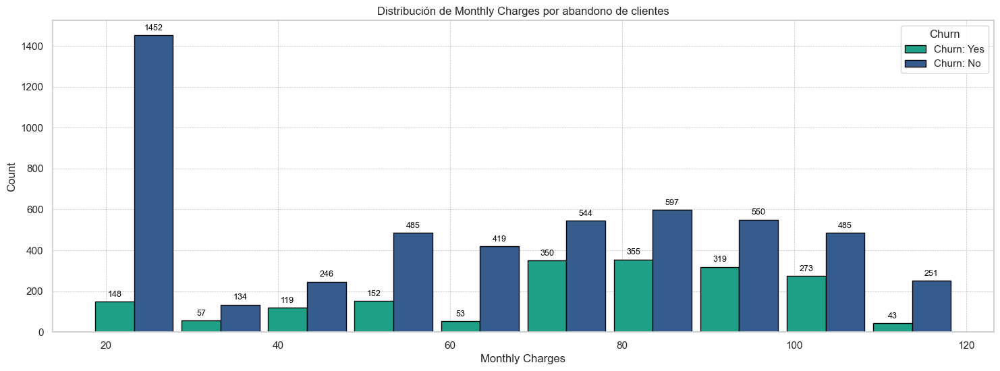

In [47]:
subplot_4(df, 'Monthly Charges')

<b>Analysis: </b>

The histogram shows that many non-churning customers fall within the lowest range of monthly charges, which may suggest that lower rates help retain customers. In contrast, the higher price ranges display a balanced presence of churn and non-churn customers, possibly indicating a difference in perception of value or quality of the service offered.

#### 4.3. Distribution of Total Charges by Customer Churn

> <b>Variables:</b> Total Charges<br><br>
> <b>Target variable:</b> Churn Value

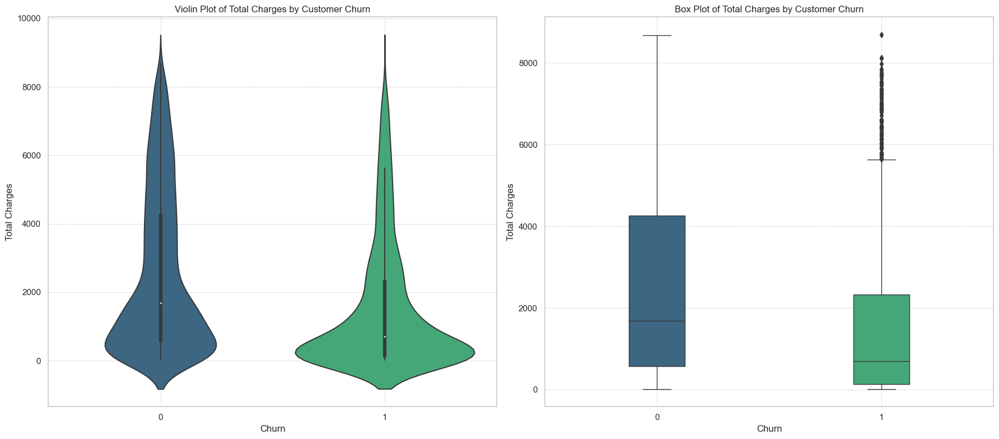

In [48]:
subplot_3(x = df['Churn Value'], 
          y = df['Total Charges'], 
          violin_title = 'Violin Plot of Total Charges by Customer Churn', 
          violin_xlabel = 'Churn', 
          violin_ylabel = 'Total Charges', 
          boxplot_title = 'Box Plot of Total Charges by Customer Churn', 
          boxplot_xlabel = 'Churn', 
          boxplot_ylabel = 'Total Charges')

<b>Analysis: </b>

<b>Violin Graph:</b> <br>
There is a clear distinction between customers who abandon the service and those who remain. Customers who do not churn (Churn = 0) exhibit a broader range of total charges, suggesting a longer relationship with the company. In contrast, customers who churn (Churn = 1) show lower accumulation of total charges, concentrating more towards the lower end of the charges spectrum. This indicates that customers who leave tend to do so before incurring significant costs, highlighting the importance of addressing retention strategies early in the customer lifecycle.<br>

<b>Boxplot:</b> <br>
It indicates that the median of total charges is significantly lower for customers who churn compared to those who remain. The distribution for loyal customers is more balanced and has fewer outliers, while the customers who churn exhibit reduced variability and a more compact distribution. This suggests that churned customers typically engage with the service for a shorter period, resulting in lower overall charges, whereas loyal customers have a more extensive usage history and potentially a stronger perceived value from the services provided.

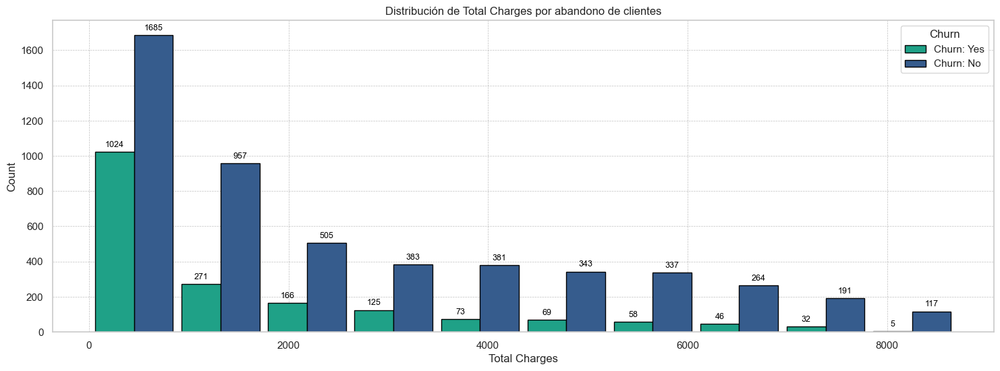

In [49]:
subplot_4(df, 'Total Charges')

<b>Analysis: </b>

This graph provides a detailed view of how total charges are distributed among customers who churn and those who do not. Customers who do not churn show a significant presence across almost all charge ranges, with particularly high numbers at both the lower and upper extremes, suggesting a strong and long-lasting relationship with the company. In contrast, customers who churn are more concentrated in the lower charge ranges, indicating that they may be leaving the service before accumulating significant amounts in total charges. This could imply that these customers are not fully engaging with the services offered, leading to their decision to discontinue.

In [50]:
df.groupby('Churn Label')['Monthly Charges'].quantile([.50,.75,.95,.99])

Churn Label      
No           0.50     64.450
             0.75     88.475
             0.95    108.445
             0.99    115.100
Yes          0.50     79.650
             0.75     94.200
             0.95    105.610
             0.99    111.132
Name: Monthly Charges, dtype: float64

As seen in the graphs, the average monthly charges of customers who have abandoned the service are higher than those of customers who do not churn. This observation may suggest that higher prices could be a contributing factor to the decision to leave, especially if customers feel that they are not receiving adequate value for the costs incurred.

#### 4.4. Categorical Variables vs. Target Variable
> <b>Categorical variables:</b> Gender, Senior Citizen, Partner, Dependents, Phone Service, Multiple Lines, Internet Service, Online Security, Online Backup, Device Protection, Tech Support, Streaming TV, Streaming Movies, Contract, Paperless, Billing, Payment Method.<br><br>
> <b>Target variables:</b> Churn Value

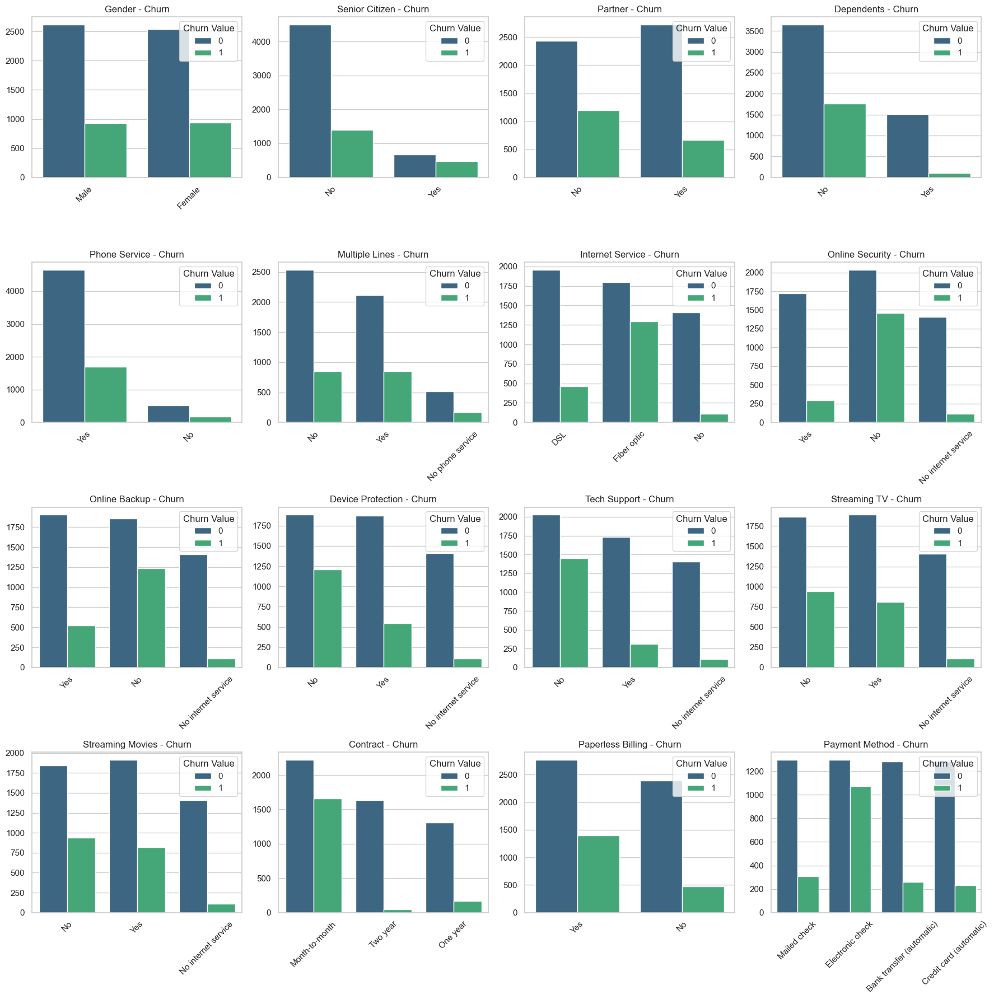

In [51]:
fig, axes = plt.subplots(4, 4, figsize=(18, 18))
axes = axes.flatten()

for i, var in enumerate(categorical_variables):
    axes[i].set_title(f'{var} - Churn')
    sns.countplot(data=df, x=var, hue='Churn Value', ax=axes[i], palette='viridis')
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

<b>Analysis: </b>

<b> 1. Gender - Churn </b>
- Both men and women exhibit similar numbers in retention (Churn Value = 0) and churn (Churn Value = 1).
- Approximately 2,500 customers of each gender did not churn. Around 1,000 customers of each gender did churn.


<b>2. Senior Citizen - Churn </b>
- Senior citizens have notably lower churn rates than non-seniors.
- A large majority of non-seniors remain with the service, but the proportion of those who leave is considerably higher compared to seniors.
- Approximately 4,000 non-senior customers did not churn, while around 1,500 did.
- In the senior group, about 500 stayed while fewer than 500 decided to churn.

<b>3. Partner - Churn </b>
- Customers without partners have a higher churn rate compared to those with partners.
- A significant number of single customers decided to churn compared to those who are partnered.
- Among single customers, approximately 2,500 did not churn, while around 1,000 did.
- For customers with partners, more than 2,000 stayed with the service, with fewer than 1,000 choosing to churn.

<b>4. Dependents - Churn </b>
- Customers without dependents show a higher churn rate compared to those with dependents.
- The difference in churn rates between the two groups is notable, with a greater proportion of customers without dependents opting to churn.
- A large number of customers without dependents, approximately 3,000, decided to stay, but over 1,500 churned.
- Among customers with dependents, about 2,500 stayed while fewer than 500 left.

<b>5. Phone Service - Churn</b>
- Customers with phone service show a lower churn rate than those without phone service.
- The majority of customers have phone service, and the proportion that churns is significantly lower compared to those who do not have this service.
- Among customers with phone service, more than 4,000 decided to stay, while around 1,500 churned.
- On the other hand, in the group without phone service, fewer than 500 customers stayed and around 250 churned.
- No Phone Service: There is a significantly smaller number of customers without phone service, but the proportion of those who churn is relatively high compared to those who have service.
- With Phone Service: The majority of customers have phone service, and the churn rate in this group is notably lower.
    
<b>6. Multiple Lines - Churn</b>
- Customers with multiple phone lines have a lower churn rate compared to those with a single line or no line.
- Customers who invest in additional services, such as multiple lines, tend to be more loyal.
- Approximately 2,500 customers with a single line remain with the service, while around 1,000 leave. In contrast, about 1,500 customers with multiple lines stay, with approximately 500 abandoning the service.    
    
<b>7. Internet Service - Churn</b>    
-Customers with fiber optic internet service have a higher churn rate compared to those with DSL or no internet service.
- Dissatisfaction with fiber optic service could be a contributing factor to their abandonment.
- The majority of customers with DSL tend to stay, while many customers with fiber optic service opt to leave. 
    
<b>8. Online Security - Churn</b> 

- Customers without online security service tend to have a higher churn rate than those who do have this service.
- The perception of security is key in the decision to continue with a provider.
- The majority of customers with online security remain with the service, suggesting a correlation between satisfaction with security measures and customer loyalty.
    
<b>9. Online Backup - Churn</b>
- Customers without online backup service present a higher churn rate than those with this service.
- This suggests that additional services providing convenience and security, such as online backup, are valued by customers and can positively influence their loyalty.
- A significant proportion of customers with online backup choose to stay with the service, while those without this service tend to leave in larger numbers.
    
<b>10. Device Protection - Churn</b>
- Similar to online backup, customers without device protection tend to abandon the service at a higher rate compared to those with protection.
- This may indicate that customers value additional measures that help protect their technology investments, which increases their satisfaction and retention.
- Customers with device protection show stronger loyalty, with a lower proportion of abandonment compared to those without this service.

<b>11. Tech Support - Churn</b>
- Customers without tech support tend to abandon the service at a much higher rate than those who do have this service.
- This suggests that the availability and quality of tech support are critical for customer satisfaction and retention, especially in services that may require regular technical assistance.
- A large majority of customers with tech support remain with the service, indicating a strong correlation between satisfaction with the support offered and customer loyalty.
- Customers without tech support show a higher propensity for abandonment, which may reflect frustrations or unresolved issues.

<b>12. Streaming TV - Churn</b>
- Customers without streaming TV service show a higher churn rate compared to those who do enjoy this service.
- This may indicate that entertainment is a valued component of the service offering, contributing to greater customer satisfaction and retention.
- Customers who have access to streaming TV tend to stay, possibly due to the value of the content and the convenience this service offers.

<b>13. Streaming Movie - Churn</b>
- Similar to streaming TV, customers without movie streaming service tend to abandon at a higher rate than those with access to streaming movies.
- This reinforces the idea that entertainment services are important for customer retention.
- Customers with movie streaming show a higher retention rate, suggesting that this service adds value to the overall offering and enhances customer satisfaction.

<b>14. Contract - Churn</b>
- Customers with monthly contracts have a much higher churn rate compared - to those with one- or two-year contracts.
- This indicates that long-term commitments may play a crucial role in customer retention, likely due to the perception of stability and the long-term economic benefits these contracts can offer.
- A large majority of customers in long-term contracts (annual and two-year) tend to remain with the service, while a significant proportion of those in monthly contracts opt to leave.     
    
<b>15. Paperless - Churn</b>
- Customers who opt for paperless billing tend to have a lower churn rate than those who do not use this service.
- This could reflect greater convenience and satisfaction with account management, as well as a potential interest in more eco-friendly practices, which may appeal to certain customer segments.
- The majority of customers with paperless billing remain with the service, while those still receiving paper bills have a higher propensity to abandon.

<b>16. Paperless Billing - Churn</b>
- Los clientes que optan por la facturación sin papel tienden a tener una tasa de abandono más baja que aquellos que no utilizan este servicio.
- Esto podría reflejar una mayor comodidad y satisfacción con la gestión de la cuenta, así como un posible interés en prácticas más ecológicas, que pueden ser atractivas para ciertos segmentos de clientes.
- La mayoría de los clientes con facturación sin papel permanecen con el servicio, mientras que aquellos que aún reciben facturas en papel tienen una mayor propensidad al abandono.

<b>16. Pament Method - Churn</b>
- Customers using electronic payment methods, such as electronic bank transfers or credit card payments, tend to have lower churn rates compared to those using more traditional methods like checks.
- This suggests that the convenience and modernity of payment methods can significantly influence customer satisfaction and retention.
- A considerable proportion of customers paying via electronic methods remain with the service, while customers paying by check show a higher churn rate.

***

#### 4.5. Customer Churn by Contract Duration

> <b>Categorical variables:</b> Contract, Tenure Months<br><br>
> <b>Target variables:</b> Churn Value

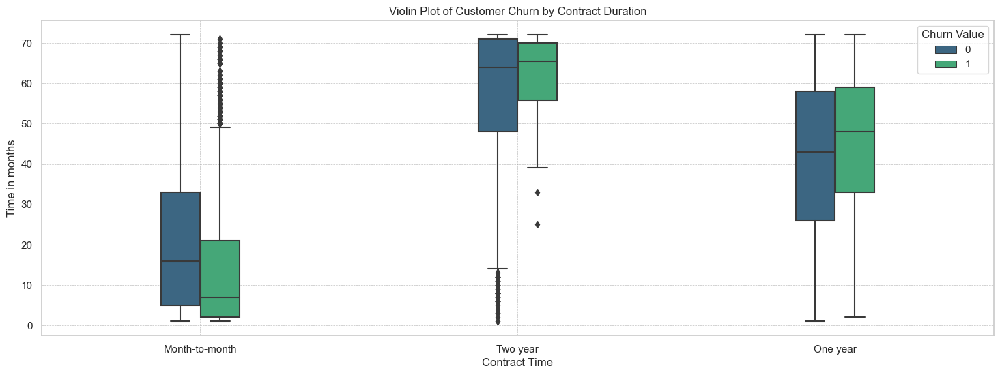

In [52]:
plt.figure(figsize=(18, 6))

sns.boxplot(data=df, x='Contract', y='Tenure Months', hue='Churn Value', palette='viridis', width=0.25)
plt.title('Violin Plot of Customer Churn by Contract Duration')
plt.xlabel('Contract Time')
plt.ylabel('Time in months')
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

<b>Analysis: </b>

Evaluating the time customers stay with the company according to the type of contract they have over time helps to obtain meaningful data about customer behavior. It allows for the assessment of how this varies based on the types of services contracted by the customers, such as internet plans, streaming services, and technical support. Additionally, it can evaluate how the customer's contract duration varies based on their demographics, such as age, geographic location, or income. This analysis helps to understand customer behavior patterns to adapt strategies regarding pricing, retention, and customer loyalty by understanding their specific preferences and needs. 

<b>Month-to-Month Contracts:</b>
    
- Churn: There is high variability in tenure duration among customers who churn, with many leaving in the first few months.
- No Churn: The tenure of customers who stay is shorter on average compared to one- and two-year contracts, which is expected in month-to-month contracts.
    
    
<b>Two-Year Contracts:</b>

- Churn: Although some customers churn, their tenure before leaving is generally longer, indicating that even customers who eventually leave tend to stay longer.
- No Churn: Customers who do not churn show long and stable tenure, which is consistent with the nature of a long-term contract.
    
    
<b>One-Year Contracts:</b>

- Churn: Similar to two-year contracts, customers who churn tend to do so after having a significant tenure.
- No Churn: Tenure for customers who stay is also longer but with less variability than in two-year contracts.


<b>Variabilidad y Mediana de Tenencia:</b>

- Month-to-month contracts show high variability in tenure for both churn and no churn, reflecting the lack of long-term commitment and the ease with which customers can switch services.
- One- and two-year contracts show greater stability in tenure, especially for those who do not churn, highlighting commitment and potential satisfaction with long-term service.

***
#### 4.6. Abandono de clientes por duracion de contrato considerando dependientes
> <b>Categorical variables:</b> Dependents, Tenure Months<br><br>
> <b>Target variables:</b> Churn Value

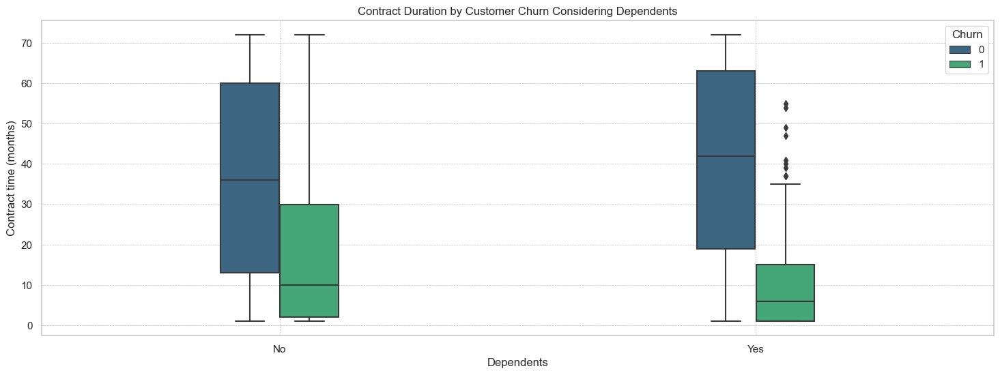

In [53]:
plt.figure(figsize=(18, 6)) 

sns.boxplot(data=df, x='Dependents', y='Tenure Months', hue='Churn Value', palette='viridis', width=0.25)
plt.title('Contract Duration by Customer Churn Considering Dependents')
plt.xlabel('Dependents')
plt.ylabel('Contract time (months)')
plt.legend(title='Churn', loc='upper right')
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

<b>Analysis: </b>

<b>Customers with Dependents:</b>

- Churn (Yes): The median contract duration is quite low, suggesting that customers without dependents who churn do so relatively early in their contract cycles.
- Churn (No): The contract duration for those who do not churn is significantly higher, indicating that if these customers stay after an initial period, they tend to remain longer.

<b>Customers without Dependents:</b>

- Churn (Yes): Similar to customers without dependents, those with dependents who decide to churn do so after shorter contract periods, although the median is slightly higher compared to those without dependents.
- Churn (No): Customers with dependents who do not churn have a notably high contract duration, even more than customers without dependents in the same non-churn category.

<b>Analysis:</b>

- Contract Duration: Contract duration is a significant indicator of retention. Customers, both with and without dependents, who stay for longer periods are less likely to churn. However, those with dependents tend to stay for longer periods than those without dependents.
- Impact of Dependents: Having dependents appears to correlate with longer contract durations before churn and a greater propensity to stay with the service long-term. This may be due to the need for stability and continuity in services that are important for families, such as access to the internet or telecommunications services.

*** 
#### 4.7. Customer Churn by Contract Duration Considering Internet Services
> <b>Categorical variables:</b> Internet Service, Tenure Months<br><br>
> <b>Target variable:</b> Churn Value

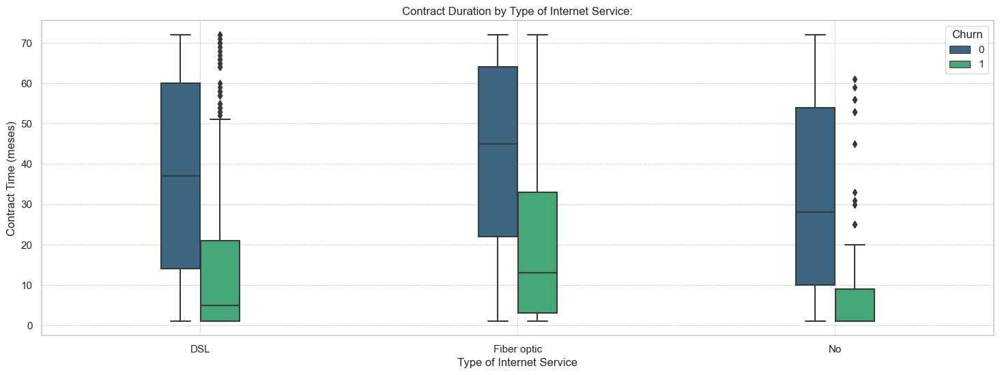

In [54]:
plt.figure(figsize=(18, 6))

sns.boxplot(data=df, x='Internet Service', y='Tenure Months', hue='Churn Value', palette='viridis', width=0.25)
plt.title('Contract Duration by Type of Internet Service:')
plt.xlabel('Type of Internet Service')
plt.ylabel('Contract Time (meses)')
plt.legend(title='Churn', loc='upper right')
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

<b>Analysis: </b>

<b>DSL:</b>

- Churn (Yes): Customers with DSL who churn tend to do so after shorter periods, with a median contract duration significantly lower than those who do not churn.
- Churn (No): Customers with DSL who do not churn have a longer contract duration, indicating a more stable and prolonged relationship.

<b>Fiber Optic:</b>

- Churn (Yes): Customers with fiber optic who churn do so after shorter periods compared to DSL, with a notably low median.
- Churn (No): Those who do not churn also have a significant contract duration, although with greater variability than in DSL.

<b>No Service:</b>

- Churn (Yes): Customers without internet service who decide to churn do so after extremely short periods, showing the lowest contract duration among all categories.
- Churn (No): Those who remain without service have a significantly longer contract duration, although this group is relatively smaller.

<b>Analysis:</b>

<b>DSL vs Fibra Óptica:</b>

- Fiber optic, despite its speed and capacity advantages, shows a higher tendency for churn in shorter periods compared to DSL. This may reflect issues with expectations, costs, or satisfaction with the service.
- DSL demonstrates greater stability in terms of contract duration before churn and also among those who decide to stay, suggesting more consistent satisfaction or fewer service issues.

<b>Impact of Not Having Internet:</b>

- The lack of internet service is associated with a high churn rate in the first months of the contract. This could indicate customers who use basic phone or television services without internet and find little value in continuing without access to the internet.

#### 4.8 Customer Churn Reasons

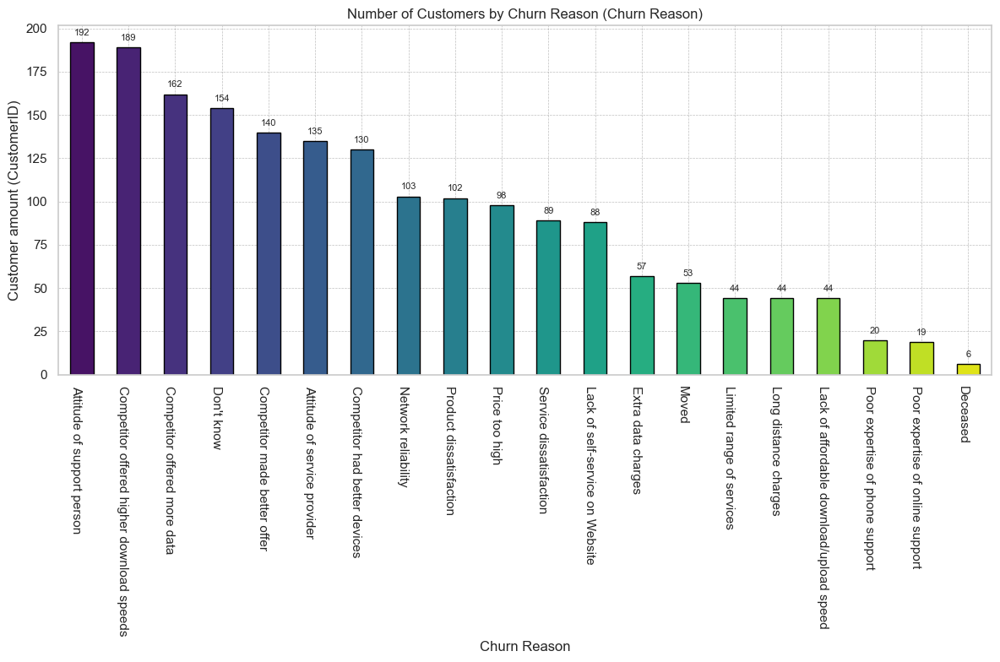

In [55]:
churn_reason_counts = df['Churn Reason'].value_counts()
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8)) 
bars = churn_reason_counts.plot(kind='bar', color=sns.color_palette("viridis", len(churn_reason_counts)), edgecolor='black')

# Each bar details
for bar in bars.patches:
    bars.annotate(format(bar.get_height(), '.0f'), 
                  (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                  ha='center', va='center', size=8, xytext=(0, 8), 
                  textcoords='offset points')

# Titles and tags
plt.title('Number of Customers by Churn Reason (Churn Reason)', fontsize=12)
plt.xlabel('Churn Reason', fontsize=12)
plt.ylabel('Customer amount (CustomerID)', fontsize=12)
plt.xticks(rotation=270, ha='right')
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5) #Cuadricula
plt.tight_layout()

plt.show()

<b>Analysis:</b>

There is a high number of customers who abandon the service because competitors offer better alternatives in terms of download speeds, data limits, and the number of devices. Additionally, a percentage of customers who leave is due to the attitude of the support team towards the customer.

***

#### 4.9. Análisis de Correlaciones

#### Numerical Variables

In [56]:
numerical_vars = ['Tenure Months', 'Monthly Charges', 'Total Charges']

#### Scatter Plots

#### Scatter Plot 1 - Relationship Between Tenure Months and Total Charges in Customer Churn

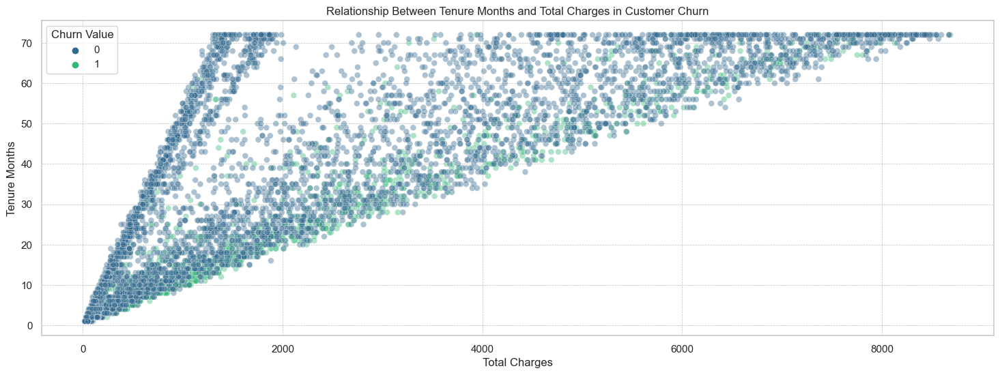

In [57]:
plt.figure(figsize=(18, 6))
sns.scatterplot(data=df, y="Tenure Months", x="Total Charges", hue="Churn Value", palette="viridis", s=40, alpha=0.4)
plt.title("Relationship Between Tenure Months and Total Charges in Customer Churn")
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

<b>Analysis: </b>

<b>Key Observations:</b><br>

<b>1. General Trend::</b>
There is a positive correlation between Total Charges and Tenure Months, which aligns with expectations. As customers remain with the company longer, their accumulated payments increase. This relationship suggests that customers who stay generate long-term value.

<b>2. Churn Distribution:</b>

- Customers Who Do Not Churn (Churn Value 0, blue dots) The uniform distribution of these customers across the range of Tenure Months and Total Charges indicates diversity in their consumption behavior. However, they dominate at the upper end of both parameters, suggesting that those who stay tend to do so for extended periods and make higher payments.
- Customers Who Churn (Churn Value 1, green dots) Most customers who have churned are concentrated in the lower range of Tenure Months and Total Charges. This indicates that many abandon the service in the early stages, which may be related to dissatisfaction or a lack of a proper fit between customer expectations and the service provided.

<b>3. High-Risk Churn Zone:</b>

There is a notable concentration of churned customers (green points) in the low to moderate tenure and total charges region. This pattern suggests that customers who experience early issues in their relationship with the service are more likely to churn. Identifying these critical points can guide the company in implementing early interventions.

<b>Analysis:</b>

<b>Customer Insights:</b>
- Customers with Lower Tenure and Lower Total Charges. This group presents a high risk of churn, which could indicate issues with the service, a lack of fit with their needs, or the allure of more competitive offers in the market. Identifying and addressing the causes of dissatisfaction for these customers is essential for improving retention.
- Customers with Longer Tenure and Higher Total Charges. Customers who remain for extended periods and generate high charges tend to be more loyal. This may relate to their perceived value of the service received. Loyalty strategies that recognize and reward this loyalty could be beneficial for maximizing retention of this segment.

#### Scatter Plot 2 - Relationship between Monthly Charges and Total Charges by Customer Churn

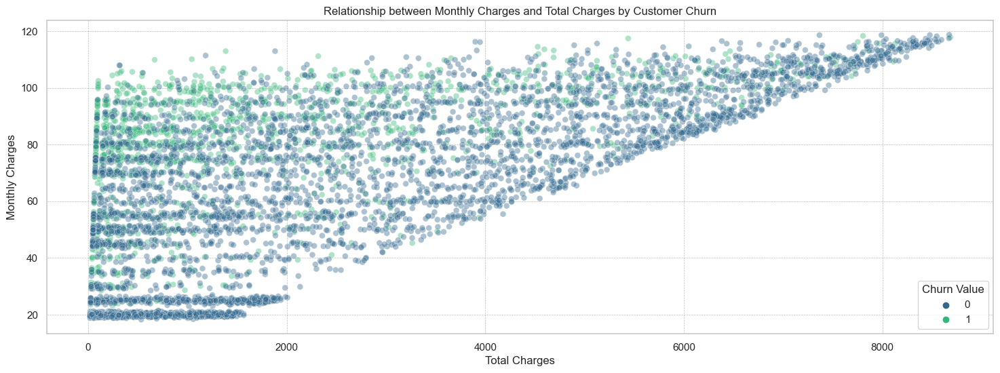

In [58]:
plt.figure(figsize=(18, 6))
sns.scatterplot(data=df, y="Monthly Charges", x="Total Charges", hue="Churn Value", palette="viridis", s=40, alpha=0.4)
plt.title("Relationship between Monthly Charges and Total Charges by Customer Churn")
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

#### Scatter Plot 3 - Relationship between Tenure Months and Monthly Charges by Customer Churn

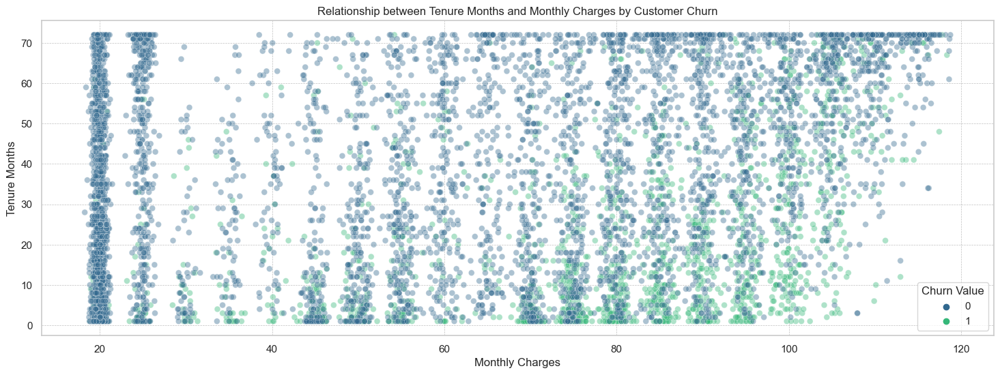

In [59]:
plt.figure(figsize=(18, 6))
sns.scatterplot(data=df, y="Tenure Months", x="Monthly Charges", hue="Churn Value", palette="viridis", s=40, alpha=0.4)
plt.title("Relationship between Tenure Months and Monthly Charges by Customer Churn")
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

<b>Analysis: </b>

<b>Key Observations:</b><br>

<b>1. General Trend:</b>

- There is no clear linear correlation between monthly charges and tenure months. However, it seems that customers with lower monthly charges tend to stay longer.

<b>2. Churn Distribution:</b>

- Customers who do not churn (Churn Value 0, blue dots) are densely distributed across the range of monthly charges, especially in the upper end of tenure.
- Customers who churn (Churn Value 1, green dots) are more concentrated in the medium to high monthly charges range and in the early stages of tenure.

<b>3.  High and Low Churn Risk Areas:</b>

- <b>High Churn Risk:</b> Most green points (churn) are observed in the monthly charges range of $60 to $100, especially for customers with less than 20 months of tenure.
- <b>Low Churn Risk:</b> Customers with low monthly charges and high tenure show a significant tendency not to churn, which is evident from the dense clustering of blue points in these segments.

<b>Analysis:</b><br>

<b>Monthly Charges as a Churn Factor:</b>

- Customers with moderate to high monthly charges and low tenure are more likely to churn. This pattern suggests that customers facing higher fees without an established loyalty period may not perceive enough value in the service to justify the cost.
- The distribution shows that as monthly charges increase, especially above 80 dollars, churn also tends to increase, particularly among customers with less tenure.<br>

<b>Implications for Pricing and Service Strategy:</b>

- It may be beneficial to review and possibly adjust pricing strategies for new customers or those in the higher charge ranges to improve perceived value and reduce early churn.
- Implementing loyalty programs or incentives that increase the perceived value of the service may help retain customers considering leaving due to perceived high monthly charges.

#### Scatter Plot 4 - Relationship between Tenure Months and CLTV by Customer Churn

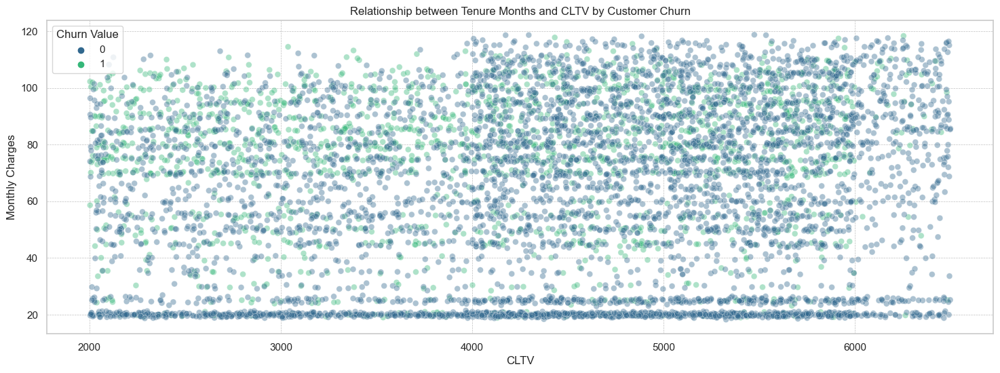

In [60]:
plt.figure(figsize=(18, 6))
sns.scatterplot(data=df, y="Monthly Charges", x="CLTV", hue="Churn Value", palette="viridis", s=40, alpha=0.4)
plt.title("Relationship between Tenure Months and CLTV by Customer Churn")
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

<b>Analysis: </b>

<b>Key Observations::</b>
<b>1. CLTV Distribution:</b>

- CLTV varies widely among customers, ranging from lower values around 2000 to higher values around 6000. The dispersion shows a range of experiences and customer valuations throughout their lifecycle.

<b>2. Relationship Between CLTV and Tenure:</b>

- There does not appear to be a clear linear correlation between CLTV and tenure months, although there is a wide dispersion of points across the entire CLTV range. This suggests that the relationship between lifetime value and tenure is not directly proportional.

<b>3. Churn Distribution::</b>

- Customers who do not churn (Churn Value 0, blue points) are densely distributed throughout the entire CLTV range, with a notable presence in higher CLTV values.
- Churning customers (Churn Value 1, green points) are also found across the CLTV range but seem to be more concentrated in medium to high CLTV values and medium to low tenures.

<b>Analysis:</b><br>
<b>1. CLTV and Churn:</b>

- The presence of non-churning customers at higher CLTV values may indicate a positive relationship between high CLTV and customer satisfaction or perceived value. However, the presence of churn across the entire CLTV range suggests that other factors, such as service satisfaction, pricing, and competition, are also influencing churn decisions.

- Churn concentrated in medium and high CLTV values but with lower tenures may signal that unmet expectations or changes in perceived value are impacting the decision to churn even among potentially valuable customers.

<b>2. Implications for Customer Strategies:<b>

- The data suggests the need to better understand customer expectations and satisfaction at all levels of CLTV to identify and address the underlying causes of churn.
    
- For customers with high CLTV but low tenure, strategies to improve the initial experience and ensure an adequate perception of value may be critical to improving retention.
    
- This graph highlights the importance of analyzing not only the duration and financial value of customer relationships but also how these dimensions interact with customer loyalty and satisfaction over time.

#### Scatter Plot 5 - Relationship Between Monthly Charge and TCV by Customer Churn

Creating a new feature like TCV (which in this context appears to represent "Total Customer Value" calculated in a simplified manner) by multiplying tenure (the duration of the customer's relationship in months) by Monthly Charges (monthly fees) is a logical and common approach to estimate the value a customer may have contributed over the time they've been with the company. This is a useful metric for understanding how much revenue a customer has generated and can help identify patterns or trends related to churn (service abandonment).

In [61]:
#Feature Engineering for EDA
#Total Customer Value
df['TCV'] = df['Tenure Months'] * df['Monthly Charges']

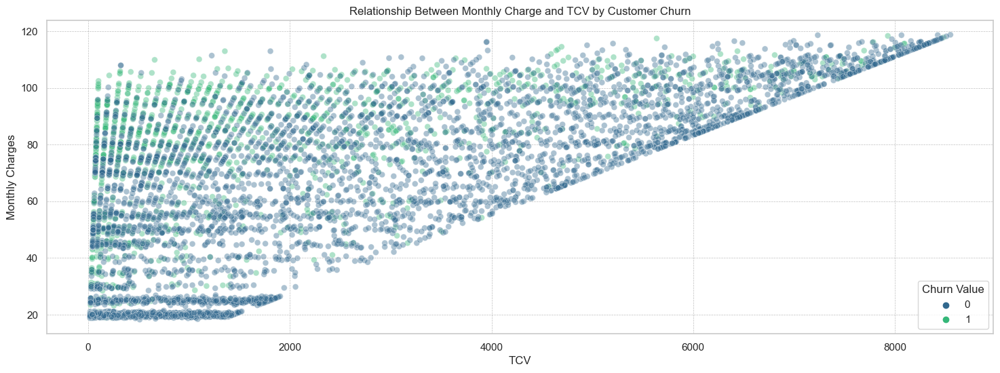

In [62]:
plt.figure(figsize=(18, 6))
sns.scatterplot(data=df, y="Monthly Charges", x="TCV", hue="Churn Value", palette="viridis", s=40, alpha=0.4)
plt.title("Relationship Between Monthly Charge and TCV by Customer Churn")
plt.grid(True, linestyle='--', linewidth=0.5, color='grey', alpha=0.5)
plt.show()

It is known that the churn rate will be significantly affected by the type of contract and the tenure of the contract. Therefore, it is important to examine the relationship between these variables in more detail.

#### Heat map

#### Heat map of services offered to customers

There are multiple types of services offered to customers. Among them are:

- Phone Service
- Multiple Lines
- Internet Service
- Online Security
- Online Backup
- Device Protection
- Tech Support
- Streaming TV
- Streaming Movies

We analyze their correlation with customer churn, that is, the target variable."

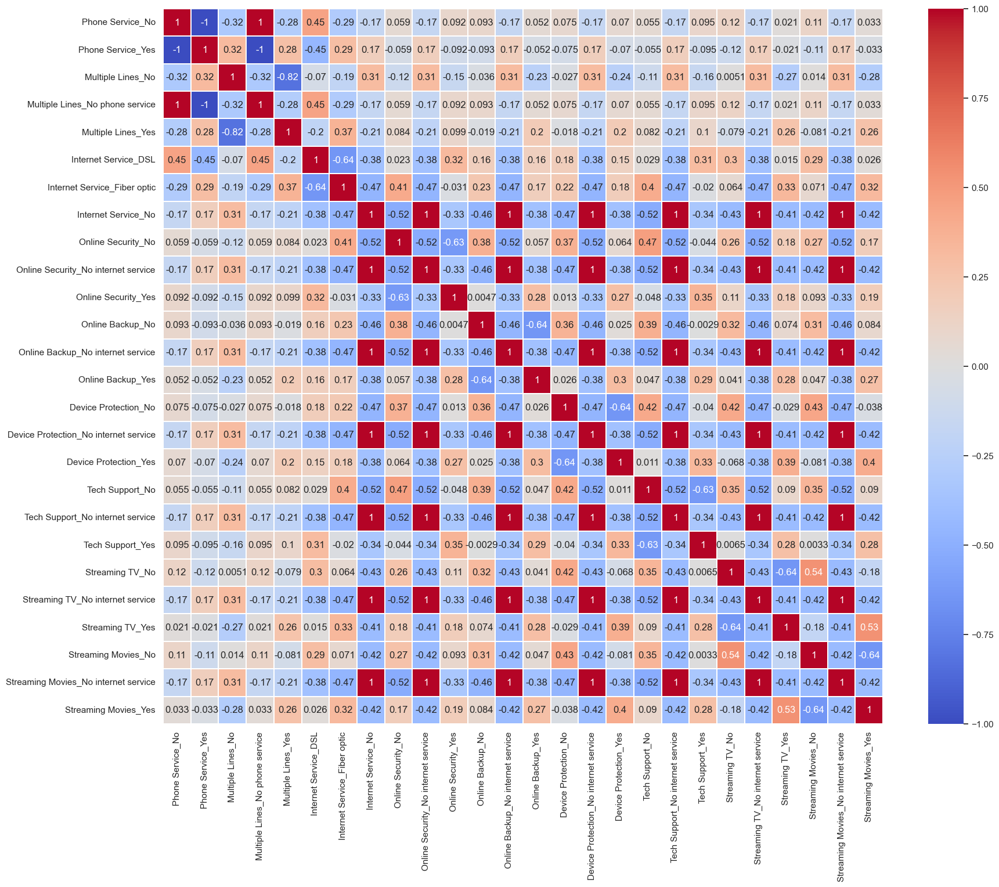

In [63]:
df_services = df.copy()
df['Churn Label'] = df['Churn Label'].map({'Yes': 1, 'No': 0})

services_list = ['Phone Service','Multiple Lines', 'Internet Service', 'Online Security',
                 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies']

plt.figure(figsize=(20, 16))
corr_matrix = pd.get_dummies(df_services[services_list]).corr()
ax = sns.heatmap(corr_matrix, xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)

<b>Analysis</b>

By visualizing the heat map, we can see that several of the services are not related to customer churn, such as online security, online backup services, and tech support. Meanwhile, it is observed that fiber optic internet could be related to customer churn.

#### Heat map of numerical variables

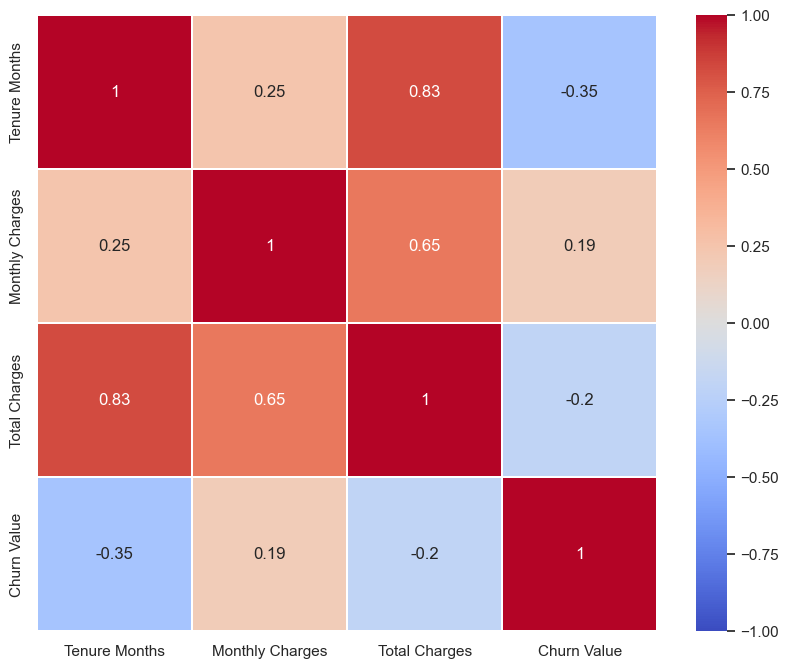

In [64]:
#df['Churn Value'] = df['Churn Value'].map({'Yes': 1, 'No': 0})
plt.figure(figsize=(10,8))
corr_matrix = df[numerical_vars + ['Churn Value']].corr()
ax = sns.heatmap(corr_matrix, xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)

In [65]:
columns_to_drop = ['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code', 'Lat Long', 'Latitude', 'Longitude', 'Churn Label', 'Churn Score', 'Churn Reason', 'CLTV', 'TCV', 'hex_id', 'hex', 'hex_code', 'geo_hex']
df2 = df.copy()
for column in columns_to_drop:
    if column in df.columns:
        df2 = df2.drop([column], axis=1)

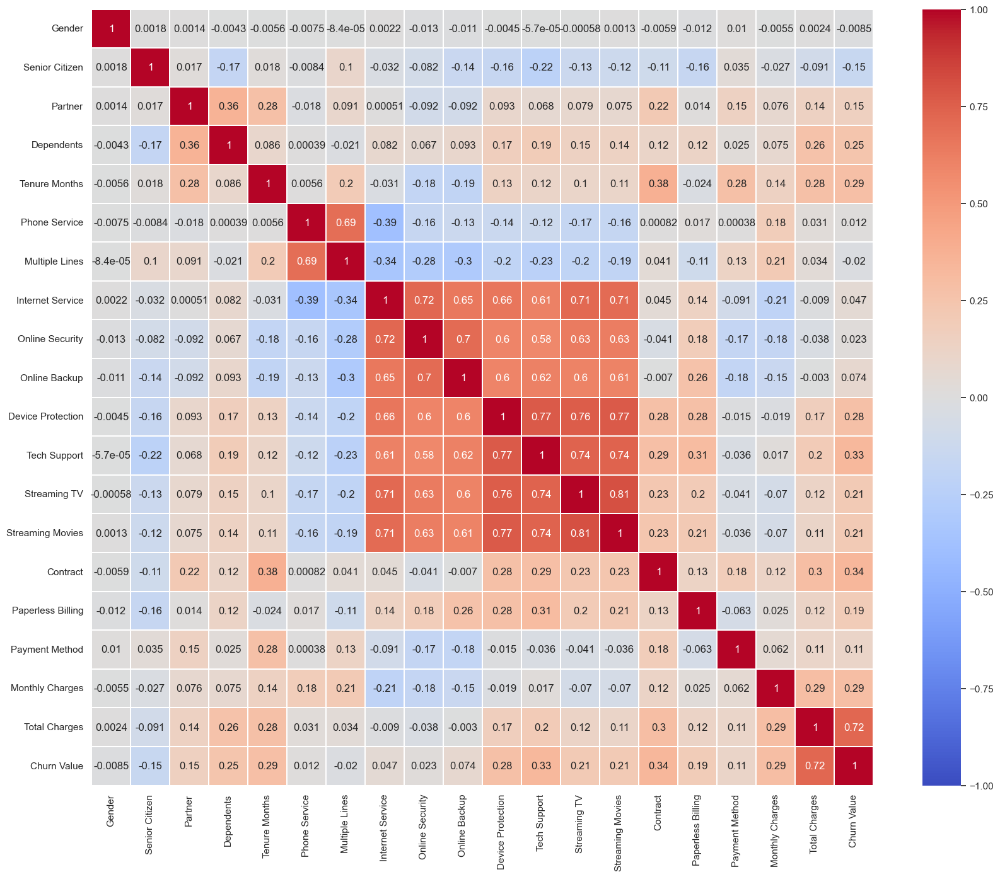

In [66]:
plt.figure(figsize=(20, 16))
# One Hot enconding
corr_matrix = df2.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr_matrix, xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=-1, vmax=1)

#### Analysis

#### EDA Conclutions

- By observing the heat map of the services that customers who stay and those who churn have, it is noted that many of those who churn are correlated with the fiber optic internet service.

- By examining the graph of customers who stay and those who churn regarding categorical variables, it is observed that around 60% of the customers who churned had the fiber optic internet service.